# Overview

In this notebook, we will classify whether people wear glasses by using the pre-trained model CLIP.


# CLIP

The CLIP(Contrastive Language-Image Pre-training) model, it is a multi-modal vision and language model. It maps images and text descriptions to the same latent space, allowing it to determine whether an image and description match. It was trained in a **contrastive** way to predict which captions correspond to which images in a dataset of over 400 million image-text pairs from the internet. And the classifiers generated by the pre-trained CLIP were shown to achieve competitive results with supervised models baseline.


# CLIP contrastive training

CLIP model consists of an Image Encoder and a Text Encoder. Below it is illustration of the CLIP training process in a mini-batch. T1 is the embedding vector of class1, I1 is the embedding vector of image1, etc. 

![](https://cdn.masto.host/sigmoidsocial/media_attachments/files/111/943/586/425/977/546/small/fc87114ec0c9a812.webp)

During training, a batch of images is processed through the Image Encoder(ResNet variant or ViT) to obtain an image representation tensor(embeddings). In parallel, their corresponding descriptions are processed through the Text Encoder(Transformer) to obtain text embeddings. The CLIP model was trained to predict which image embedding belongs to which text embedding in a batch. This is achieved by jointly training the Image Encoder and Text Encoder to maximize the [cosine similarity(see Distance between vectors)](https://www.kaggle.com/code/aisuko/appendix-embeddings) between the image and text embeddings of real pairs in the batch while minimizing the cosine similarity between the embeddings of incorrect pairings. The optimization is performed using a symmetric cross-entropy loss over these similarity scores.


## Creating a Custom Classifier

To create a custom classifier using CLIP, the name of the classes are transformed into a text embedding vector by the pre-trained Text Encoder, while the image is embedded using the pre-trained Image Encoder. The cosine similarity betweent eh images embedding and each of the text embeddings is then computed, and the image is assigned to the class with the highest cosine similarity score.

![](https://cdn.masto.host/sigmoidsocial/media_attachments/files/111/943/634/275/384/147/small/ee626c8f309ec402.webp)

In [1]:
!pip install clip-openai==1.0.post20230121

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 27.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 3.6 MB/s eta 0:00:00


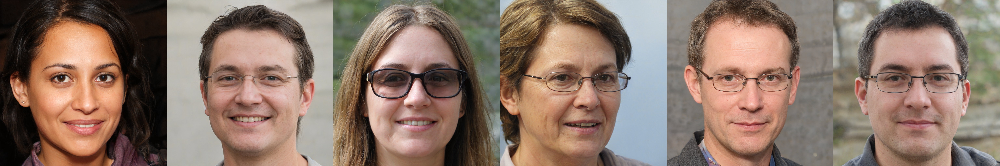

In [2]:
import random
import os
from PIL import Image

def display_random_images(dir_path, num_images, seed, save_path=None):
    random.seed(seed)
    image_paths=[]
    for subdir, dirs, files in os.walk(dir_path):
        for file in files:
            file_path=os.path.join(subdir, file)
            if file_path.endswith(".png"):
                image_paths.append(file_path)
                
    random_images=random.sample(image_paths, num_images)
    
    images=[Image.open(image_path) for image_path in random_images]
    widths, heights=zip(*(i.size for i in images))
    
    total_width=sum(widths)
    max_height=max(heights)
    
    new_im=Image.new('RGB',(total_width, max_height))
    
    x_offset=0
    for im in images:
        new_im.paste(im, (x_offset,0))
        x_offset+=im.size[0]
    if save_path:
        new_im.save(save_path)
    display(new_im)

display_random_images(dir_path='/kaggle/input/glasses-or-no-glasses/faces-spring-2020/faces-spring-2020',
                     num_images=6,
                     seed=12,
                     save_path='random_data.jpg')

Extract image path and label from CSV, using PyTorch Dataset class.

In [3]:
import pandas as pd
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, csv_path, images_folder):
        self.df=pd.read_csv(csv_path)[['id','glasses']]
        self.images_folder=images_folder
        self.class2index={'no glasses':0, 'glasses':1}
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, index):
        filename=f'face-{self.df.iloc[index,0]}.png'
        label=self.df.iloc[index,-1]
        image_path=os.path.join(self.images_folder, filename)
        return image_path, label

path_images=r'/kaggle/input/glasses-or-no-glasses/faces-spring-2020/faces-spring-2020'
path_csv=r'/kaggle/input/glasses-or-no-glasses/train.csv'
glasses_dataset=CustomDataset(path_csv, path_images)
len(glasses_dataset)

4500

# CLIP CustomClassifier

This `CustomClassifier` class defines a custom zero-shot image classifier by using CLIP. The `classify` method classifies a single image, while the `validate` method classifies a directory of images and evaluates performance.

In [4]:
import clip
import numpy as np
from tqdm import tqdm
from sklearn.metrics import accuracy_score

class CustomClassifier:
    def __init__(self, prompts):
        self.class_prompts=prompts
        self.device='cuda' if torch.cuda.is_available() else 'cpu'
        self.model, self.preprocess=clip.load('RN50', device=self.device)
        self.preprocessed_text=clip.tokenize(self.class_prompts).to(self.device)
        print(f'Classes Prompts:{self.class_prompts}')
    
    def classify(self, image_path, y_true=None):
        preprocessed_image=self.preprocess(Image.open(image_path)).unsqueeze(0).to(self.device)
        with torch.no_grad():
            image_logits,_=self.model(preprocessed_image, self.preprocessed_text)
            proba_list=image_logits.softmax(dim=-1).cpu().numpy()[0]
        
        y_pred=np.argmax(proba_list)
        y_pred_proba=np.max(proba_list)
        y_pred_token=self.class_prompts[y_pred]
        results=pd.DataFrame([{'image': image_path, 
                              'y_true': y_true, 
                              'y_pred': y_pred,
                              'y_pred_token': y_pred_token,
                              'proba': y_pred_proba}])
        return results
    
    def validate(self, dataset, max_images):
        df_results=pd.DataFrame()
        for sample in tqdm(range(max_images)):
            image_path, class_idx=dataset[sample]
            image_results=self.classify(image_path, class_idx)
            df_results=pd.concat([df_results, image_results])
        
        accuracy=accuracy_score(df_results.y_true, df_results.y_pred)
        print(f'Accuracy - {round(accuracy,2)}')
        return accuracy, df_results

Prediction of a single image:

In [5]:
import torch

image_path=r'/kaggle/input/glasses-or-no-glasses/faces-spring-2020/faces-spring-2020/face-1.png'
prompts=['no glasses', 'glasses']
image_results=CustomClassifier(prompts).classify(image_path)

print(f'Prediction-{image_results.y_pred_token[0]}')
display(image_results)

100%|███████████████████████████████████████| 244M/244M [00:12<00:00, 20.5MiB/s]


Classes Prompts:['no glasses', 'glasses']
Prediction-no glasses


,image,y_true,y_pred,y_pred_token,proba
0,/kaggle/input/glasses-or-no-glasses/faces-spri...,None,0,no glasses,0.973145


# Evaluation

Classification and evaluation of an entire images folder

In [6]:
accuracy, df_results=CustomClassifier(prompts).validate(glasses_dataset, max_images=10)
display(df_results)

Classes Prompts:['no glasses', 'glasses']


100%|██████████| 10/10 [00:00<00:00, 11.63it/s]

Accuracy - 0.9


,image,y_true,y_pred,y_pred_token,proba
0,/kaggle/input/glasses-or-no-glasses/faces-spri...,0,0,no glasses,0.973145
0,/kaggle/input/glasses-or-no-glasses/faces-spri...,1,1,glasses,0.531250
0,/kaggle/input/glasses-or-no-glasses/faces-spri...,1,1,glasses,0.746094
0,/kaggle/input/glasses-or-no-glasses/faces-spri...,0,0,no glasses,0.795898
0,/kaggle/input/glasses-or-no-glasses/faces-spri...,0,0,no glasses,0.988770
0,/kaggle/input/glasses-or-no-glasses/faces-spri...,1,0,no glasses,0.592773
0,/kaggle/input/glasses-or-no-glasses/faces-spri...,1,1,glasses,0.749023
0,/kaggle/input/glasses-or-no-glasses/faces-spri...,1,1,glasses,0.705566
0,/kaggle/input/glasses-or-no-glasses/faces-spri...,0,0,no glasses,0.831055
0,/kaggle/input/glasses-or-no-glasses/faces-spri...,1,1,glasses,0.542969


# Prompt Engineering

In [7]:
prompts=['face without glasses', 'face with glasses']

accuracy, df_results=CustomClassifier(prompts).validate(glasses_dataset, max_images=10)

Classes Prompts:['face without glasses', 'face with glasses']


100%|██████████| 10/10 [00:00<00:00, 14.29it/s]

Accuracy - 1.0


In [8]:
prompts=['photo of a man with no glasses', 'photo of a man with glasses']
accuracy, df_results=CustomClassifier(prompts).validate(glasses_dataset, max_images=10)

Classes Prompts:['photo of a man with no glasses', 'photo of a man with glasses']


100%|██████████| 10/10 [00:00<00:00, 14.31it/s]

Accuracy - 1.0


# Credit

* https://towardsdatascience.com/clip-creating-image-classifiers-without-data-b21c72b741fa
* https://arxiv.org/pdf/2103.00020v1.pdf